In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import fill
import numpy as np
import pandas as pd
import scanpy.external as sce
import scanpy as sc
import anndata as an
from scipy.spatial.distance import cdist
import scvelo as scv
import gget
import re
import rapids_singlecell as rsc
from scipy.stats import linregress
from sklearn.preprocessing import MinMaxScaler
# import cellrank as cr

sc.settings.verbosity = 3 

print(scv.__version__)

0.3.3


In [2]:
import warnings
warnings.filterwarnings("ignore")

import logging
logging.getLogger('py.warnings').setLevel(logging.ERROR)

# Load expression

In [3]:
%%time
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/pseudotime.h5ad"
adata = sc.read_h5ad(fpath)
adata.X = adata.layers['log_norm'].copy()
adata

CPU times: user 886 ms, sys: 3.48 s, total: 4.36 s
Wall time: 10.2 s


AnnData object with n_obs × n_vars = 15867 × 21412
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersio

In [4]:
print(f"{len(adata.obs_names)=}")
print(f"{adata.obs_names.nunique()=}")

len(adata.obs_names)=15867
adata.obs_names.nunique()=15867


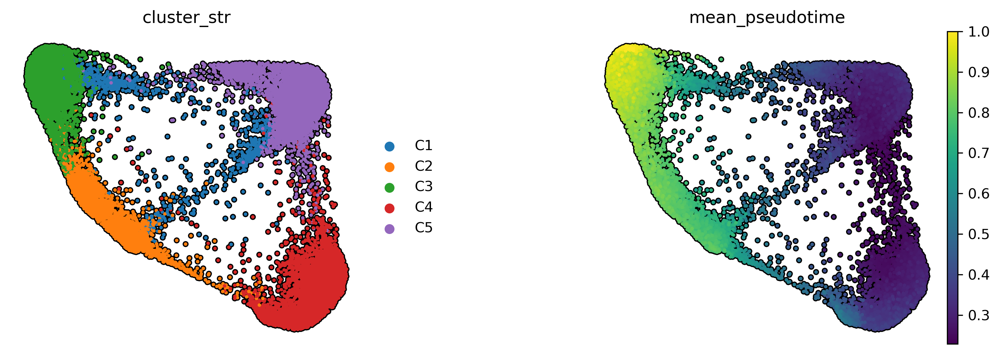

In [5]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.draw_graph(
    adata, 
    color=['cluster_str', 'mean_pseudotime'],
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.5,
)

In [6]:
# break

# Load Velocity

In [7]:
%%time

fpaths = {
    "hsc" : "/scratch/indikar_root/indikar1/shared_data/hsc_velocyto/merged_NKUVW.loom",
    "fib" : "/scratch/indikar_root/indikar1/shared_data/fib_velocyto/merged_PW6SH.loom",
}

ldatas = []
for key, fpath in fpaths.items():
    print(f"Working {key}...")

    ldata = sc.read_loom(fpath)
    ldata.var_names_make_unique()

    # set the cell-ids back to barcodes
    ldata.obs['velocyto_cell_id'] = ldata.obs_names.copy()
    ldata.obs['cell_id'] = ldata.obs['velocyto_cell_id'].apply(lambda x: x.split(":")[1][:-1] + "-1")
    ldata.obs_names = ldata.obs['cell_id'].values

    # Print initial cell counts
    print(f"\tInitial cell count in ldata: {ldata.shape[0]}")
    print(f"\tInitial cell count in adata: {adata.shape[0]}")
    
    # IDs not retained in ldata
    removed_from_ldata = ldata.obs.index[~ldata.obs.index.isin(adata.obs_names)].tolist()
    
    # IDs not retained in adata
    removed_from_adata = adata.obs.index[~adata.obs.index.isin(ldata.obs_names)].tolist()
    
    # Filter ldata to keep only cells present in adata
    initial_ldata_count = ldata.shape[0]
    ldata = ldata[ldata.obs.index.isin(adata.obs_names), :].copy()
    print(f"\tFiltered ldata: {ldata.shape[0]} cells kept, {initial_ldata_count - ldata.shape[0]} cells removed")

    ldatas.append(ldata)

    
ldata = an.concat(ldatas)   
ldata

Working hsc...
	Initial cell count in ldata: 11933
	Initial cell count in adata: 15867
	Filtered ldata: 8326 cells kept, 3607 cells removed
Working fib...
	Initial cell count in ldata: 8963
	Initial cell count in adata: 15867
	Filtered ldata: 7541 cells kept, 1422 cells removed
CPU times: user 1min 21s, sys: 28.8 s, total: 1min 49s
Wall time: 1min 50s


AnnData object with n_obs × n_vars = 15867 × 38606
    obs: 'velocyto_cell_id', 'cell_id'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

# Merge and Filter

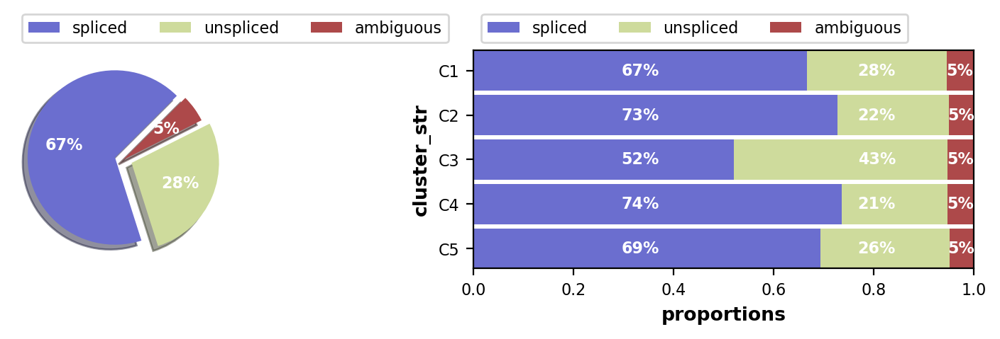

AnnData object with n_obs × n_vars = 15867 × 21412
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz', 'velocyto_cell_id', 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total

In [8]:
adata = scv.utils.merge(adata, ldata)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 7, 5

scv.pl.proportions(adata, groupby='cluster_str', dpi=200)

adata

In [9]:
# break

# RNA Velocity

In [10]:
%%time
rsc.pp.neighbors(adata, n_neighbors=150, use_rep='X_pca_harmony')
scv.pp.moments(adata, use_rep='X_pca_harmony')

scv.tl.recover_dynamics(adata, n_jobs=8) 

[2025-05-14 12:03:32.373] [CUML] [debug] n_neighbors=150
[2025-05-14 12:03:32.373] [CUML] [debug] Calling knn graph run
[2025-05-14 12:03:32.373] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-05-14 12:03:32.402] [CUML] [debug] Done. Calling remove zeros
Normalized count data: spliced, unspliced.
computing moments based on connectivities
    finished (0:00:36) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 8/40 cores)


  0%|          | 0/705 [00:00<?, ?gene/s]

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/multiprocessing/popen_fork.py:66: DeprecationWarning: This process (pid=2604572) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (0:10:27) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
CPU times: user 2min 5s, sys: 41.9 s, total: 2min 47s
Wall time: 11min 5s


In [11]:
# break

computing velocities


/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/tools/optimization.py:184: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  gamma[i] = np.linalg.pinv(A.T.dot(A)).dot(A.T.dot(y[:, i]))


    finished (0:00:48) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
        Consider computing the graph in an unbiased manner 
        on full expression space by not specifying basis.

computing velocity graph (using 8/40 cores)


  0%|          | 0/15867 [00:00<?, ?cells/s]

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/multiprocessing/popen_fork.py:66: DeprecationWarning: This process (pid=2604572) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (0:00:25) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:03) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-

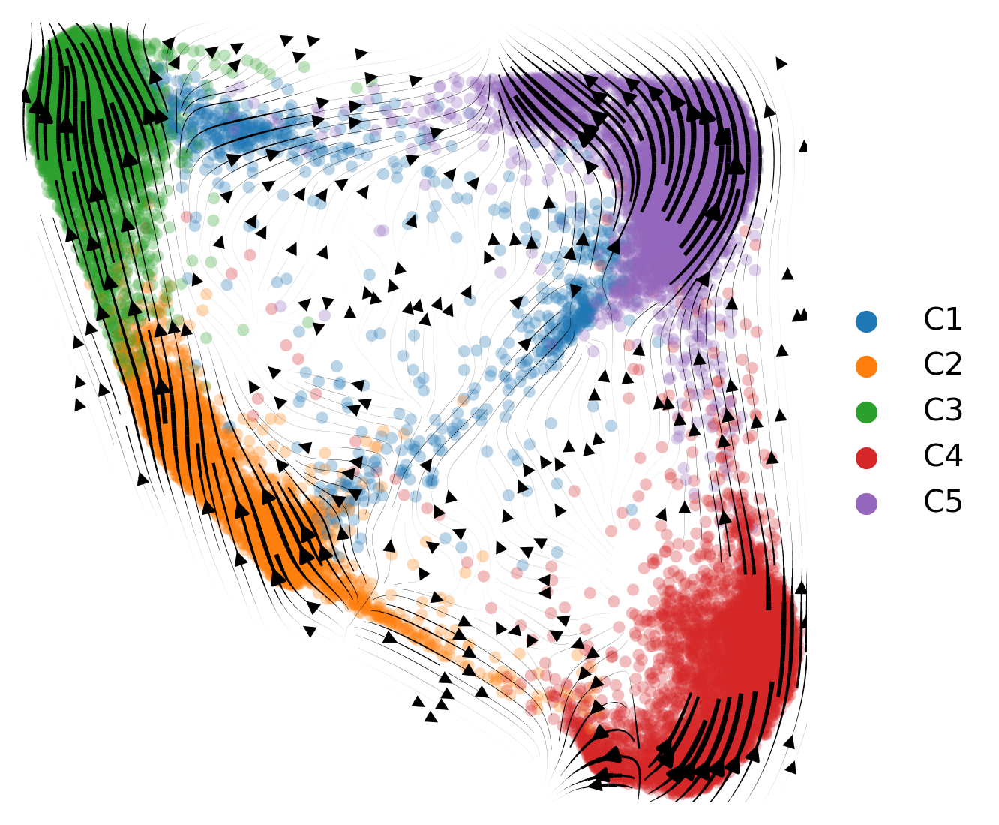

CPU times: user 50.2 s, sys: 31.4 s, total: 1min 21s
Wall time: 1min 23s


In [12]:
%%time
# scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity(adata)

scv.tl.velocity_graph(
    adata, 
    n_jobs=8,
    basis='X_pca_harmony',
    n_neighbors=150,
)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4.5, 4.5

scv.pl.velocity_embedding_stream(
    adata, 
    density=(3, 3),
    basis='X_draw_graph_fa',
    color='cluster_str',
    smooth=True,
    title="",
    legend_loc='right_margin',
)

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-

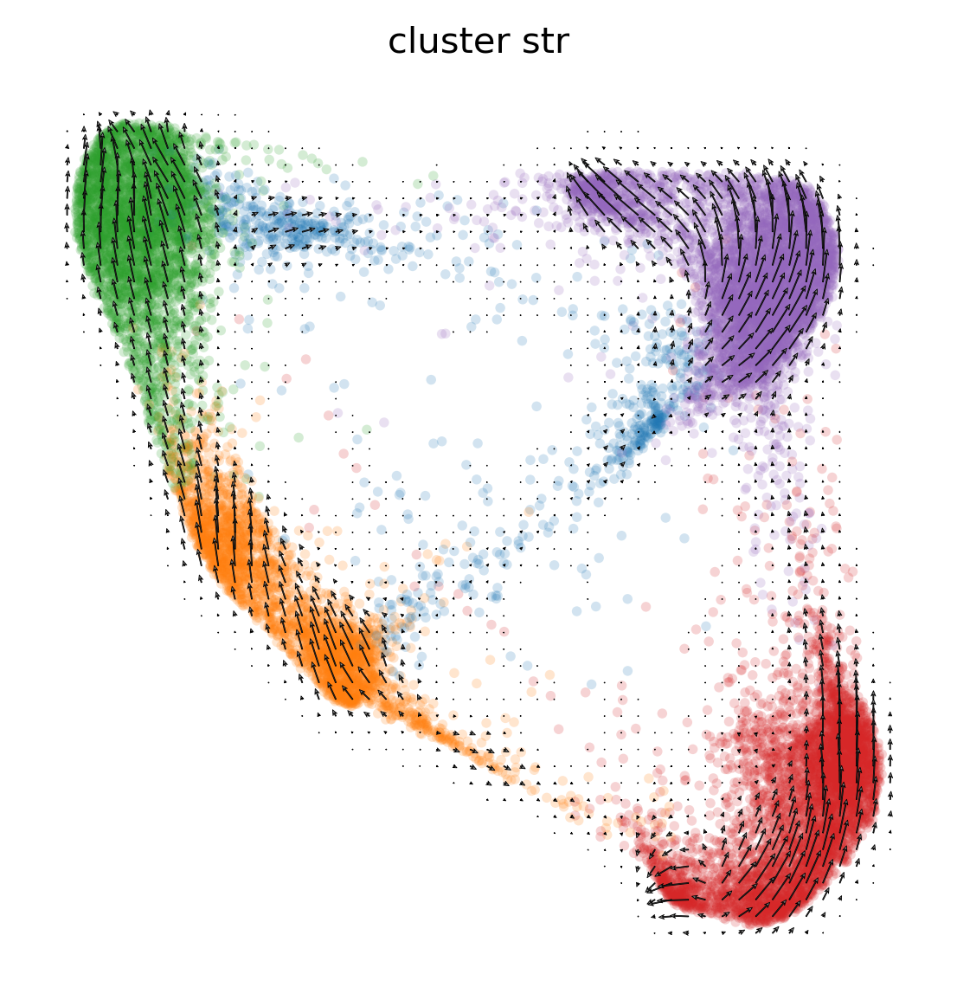

In [13]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4.5, 4.5

scv.pl.velocity_embedding_grid(
    adata, 
    basis='X_draw_graph_fa',
    color='cluster_str',
    smooth=True,
    arrow_length=2,
)


# Velocity Genes

In [14]:
n_genes = 100
n_cells_by_counts = 200
df = adata.var.sort_values(by='fit_likelihood', ascending=False).copy()
df = df[df['n_cells_by_counts'] > n_cells_by_counts]

columns = [
    'mean_counts',
    'fit_beta', 
    'fit_gamma', 
    'fit_scaling', 
    'fit_likelihood', 
    'fit_pval_steady',
    'velocity_gamma',
    'velocity_qreg_ratio',
    'velocity_r2'
]

print(df[columns].head().to_string())

           mean_counts  fit_beta  fit_gamma  fit_scaling  fit_likelihood  fit_pval_steady  velocity_gamma  velocity_qreg_ratio  velocity_r2
CALD1        15.338211  0.866044   0.603586     0.372357        0.501419         0.482345        0.740973             0.773072     0.869564
LINC00842     1.636748  1.300212   0.650570     0.275951        0.495143         0.476781        0.400245             0.515737     0.845892
HMGB1         9.063685  3.739177   0.455442     0.062385        0.468286         0.494334        0.127806             0.139207     0.773132
TOP2A         3.908573  1.126174   0.839282     0.475333        0.463863         0.446563        0.920577             0.904426     0.878317
TMPO          1.526515  0.082650   0.303630    12.534142        0.461907         0.360088        4.007644             7.063608     0.574162


12:16:02 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


                                           clean_path  adj_p_val              genes
                               DNA topological change   0.000066  TOP2A,HMGB2,HMGB1
                              DNA conformation change   0.000319  TOP2A,HMGB2,HMGB1
                            apoptotic nuclear changes   0.000525  TOP2A,HMGB2,HMGB1
                                  V(D)J recombination   0.009402        HMGB2,HMGB1
positive regulation of endothelial cell proliferation   0.010899 SEMA5A,HMGB2,HMGB1
                          apoptotic DNA fragmentation   0.012369        HMGB2,HMGB1
                       positive regulation of binding   0.012369  HMGB2,HMGB1,HIPK2
               DNA catabolic process, endonucleolytic   0.021427        HMGB2,HMGB1
                                 DNA geometric change   0.024410        HMGB2,HMGB1
                   positive regulation of DNA binding   0.034264        HMGB2,HMGB1
                         sister chromatid segregation   0.034264         TOP

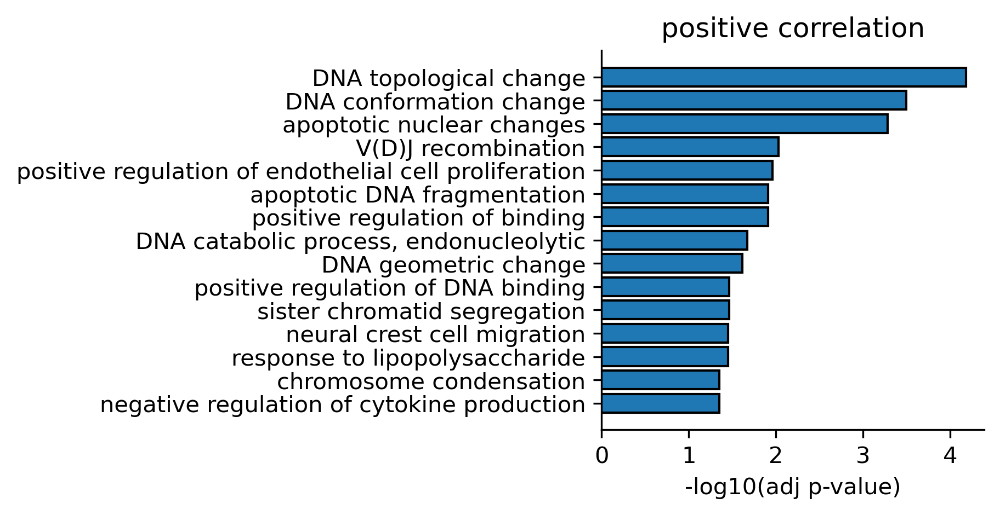

In [15]:
n = 25
alpha = 0.05
n_show = 15
database = 'ontology'
top_n = df.nlargest(n, 'velocity_r2')

edf = gget.enrichr(top_n.index, database=database)
edf['genes'] = edf['overlapping_genes'].apply(lambda x: ",".join(x))
edf['clean_path'] = edf['path_name'].str.replace(r'\s*\(GO:\d+\)', '', regex=True)
print(edf[['clean_path', 'adj_p_val', 'genes',]].head(n_show).to_string(index=False))
                                                               
plot_df = edf.head(n_show)

# Pl24
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3
plt.barh(plot_df['clean_path'], -np.log10(plot_df['adj_p_val']), ec='k')
plt.xlabel('-log10(adj p-value)')
plt.gca().invert_yaxis()
plt.title('positive correlation')
sns.despine()
plt.show()

12:16:03 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


                                                           clean_path  adj_p_val         genes
                regulation of blood vessel endothelial cell migration   0.099206   AKT3,CSNK2B
retrograde vesicle-mediated transport, Golgi to endoplasmic reticulum   0.099206    RAB1A,RER1
                               mitochondrial translational elongation   0.099206 MRPL41,MRPL54
                              mitochondrial translational termination   0.099206 MRPL41,MRPL54
                         regulation of glycoprotein metabolic process   0.099206         RAB1A
                                           neuroinflammatory response   0.099206         ITGB1
            regulation of inward rectifier potassium channel activity   0.099206         ITGB1
                positive regulation of glycoprotein metabolic process   0.099206         RAB1A
                              cell-cell adhesion mediated by integrin   0.099206         ITGB1
                                            transl

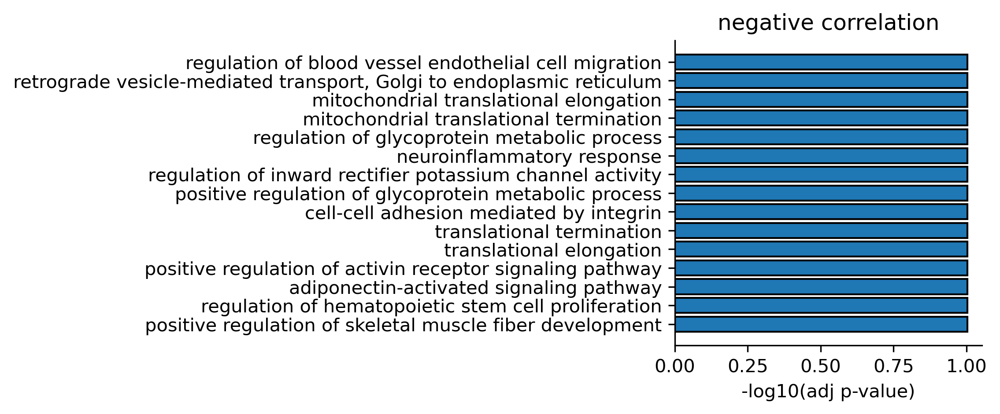

In [16]:
n = 25
alpha = 0.05
n_show = 15
database = 'ontology'
top_n = df.nsmallest(n, 'velocity_r2')

edf = gget.enrichr(top_n.index, database=database)
edf['genes'] = edf['overlapping_genes'].apply(lambda x: ",".join(x))
edf['clean_path'] = edf['path_name'].str.replace(r'\s*\(GO:\d+\)', '', regex=True)
print(edf[['clean_path', 'adj_p_val', 'genes',]].head(n_show).to_string(index=False))
                                                               
plot_df = edf.head(n_show)

# Pl24
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3
plt.barh(plot_df['clean_path'], -np.log10(plot_df['adj_p_val']), ec='k')
plt.xlabel('-log10(adj p-value)')
plt.gca().invert_yaxis()
plt.title('negative correlation')
sns.despine()
plt.show()

# Velocity Genes by Cluster

In [17]:
scv.tl.rank_velocity_genes(adata, groupby='cluster_str', min_corr=.3)

df = pd.DataFrame(adata.uns['rank_velocity_genes']['names'])
print(df.head(25).to_string())

ranking velocity genes


/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/tools/utils.py:463: DeprecationWarning: Please import `rankdata` from the `scipy.stats` namespace; the `scipy.stats.stats` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.stats.stats import rankdata


    finished (0:01:47) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)
           C1          C2         C3        C4       C5
0        NEXN    SERPINE1     KCNMA1    KIF18B   KIF26B
1       LAMA2         CLU      MAGI1      NSD2     BDNF
2        RND3       KRT19       DLG1    CCDC18    PRKG1
3     GRAMD2B         MGP       PTK2       JUN    WNT5A
4       USP53       SPARC      APBB2      RFC3    SVEP1
5       HIF1A        RBP1      SNX29      BUB1    SSBP2
6      ARID5B      TUBA1B  MIR193BHG     BRIP1     AFF3
7        NAV2         LXN      ABTB2     BARD1    ARMC9
8       KCNK2        RND3        GLS     HJURP    PAMR1
9       THBS1   LINC00842        MCC     KCNQ5     AHRR
10      REV3L  APCDD1L-DT        FER      NRG1      MKX
11      LMCD1       MORC3      ASAP1    SLC8A1   PRSS12
12      ARMC9   MIR193BHG      SLIT3     CENPK   PARD3B
13       UACA       ACTG1      ABCC3  C21orf58   PD

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-

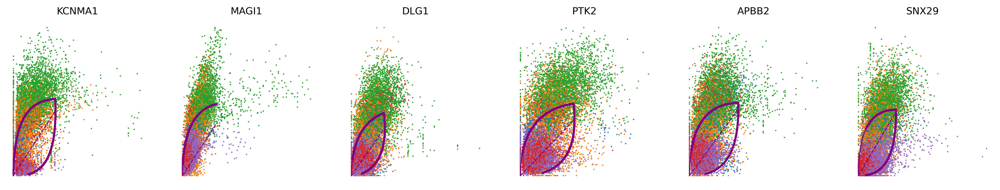

In [18]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3

scv.pl.scatter(
    adata, 
    basis=df['C3'].head(6).values,
    color='cluster_str', 
    smooth=True,
    frameon=False,
)

# Marker genes

In [19]:
fpath = "../../resources/clean_marker_genes.csv"
mdf = pd.read_csv(fpath)
mdf['category'].value_counts()

category
endothelial      4841
fibroblast       1532
hematopoietic     931
Name: count, dtype: int64

In [20]:
cell_category = "hematopoietic"

# load the markers
fpath = "../../resources/clean_marker_genes.csv"
mdf = pd.read_csv(fpath)

# filter the markers
mdf = mdf[mdf['category'] == cell_category][['gene_name', 'is_tf', 'category']].drop_duplicates()


var = adata.var.copy()
var = var[['fit_likelihood', 'velocity_r2','spearmans_score']]
print(var.columns)
var = var.sort_values('spearmans_score', ascending=False)
var = var.reset_index(names='gene_name')

# merge marker genes
var = var[var['gene_name'].isin(mdf['gene_name'].values)]
var = pd.merge(var, mdf, how='left')
print(var.head(25).to_string(index=False))

Index(['fit_likelihood', 'velocity_r2', 'spearmans_score'], dtype='object')
gene_name  fit_likelihood  velocity_r2  spearmans_score  is_tf      category
  ALDH1A1    1.570604e-01     0.694702         0.855454  False hematopoietic
    THBS1    2.900294e-01     0.116085         0.819766  False hematopoietic
     PTMA             NaN     0.405674         0.791146  False hematopoietic
    HMGB1    4.682861e-01     0.773132         0.771565   True hematopoietic
    ITGA6    1.839131e-01     0.628462         0.762782  False hematopoietic
    IRAK3    1.869793e-01     0.742738         0.746842  False hematopoietic
   ANGPT1    1.959416e-01     0.342902         0.724990  False hematopoietic
   TUBA1B    3.080622e-01     0.378194         0.722989  False hematopoietic
    KITLG    1.969057e-01     0.162774         0.706797  False hematopoietic
    ACTG1    2.666872e-01     0.349414         0.691258  False hematopoietic
 SERPING1    2.553561e-01     0.105452         0.677519  False hematopoietic


In [21]:
# break

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-

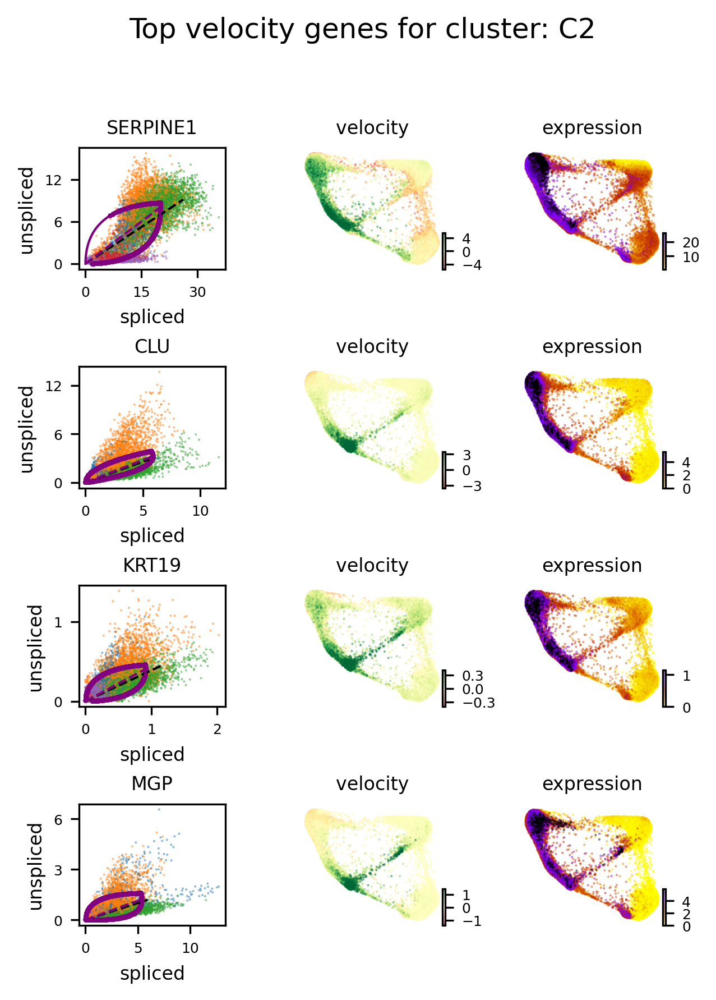

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-

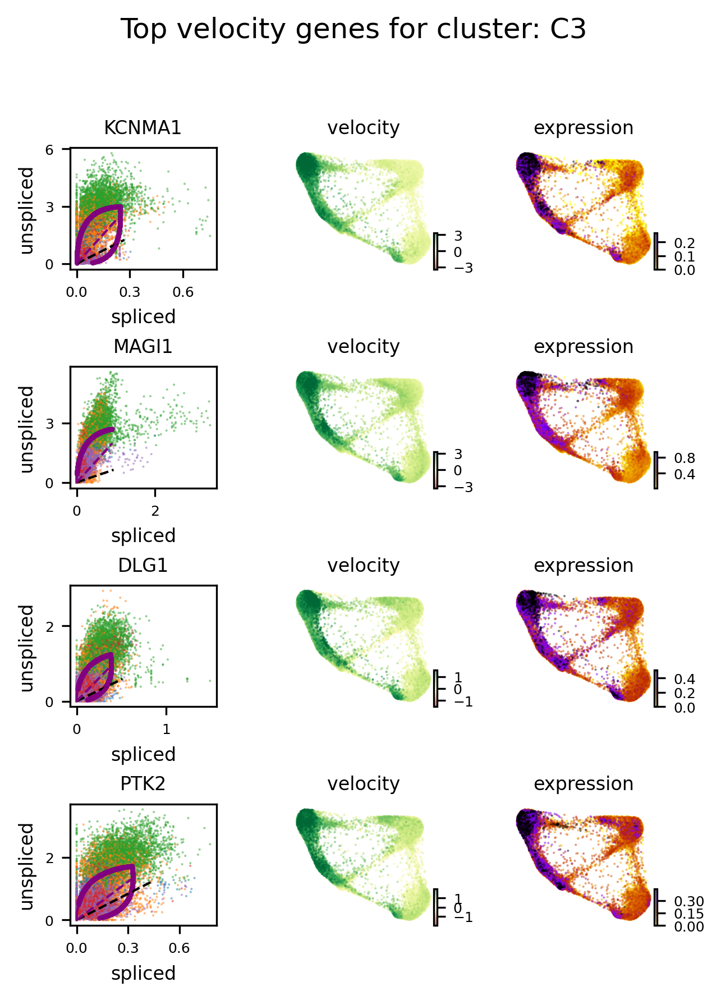

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-

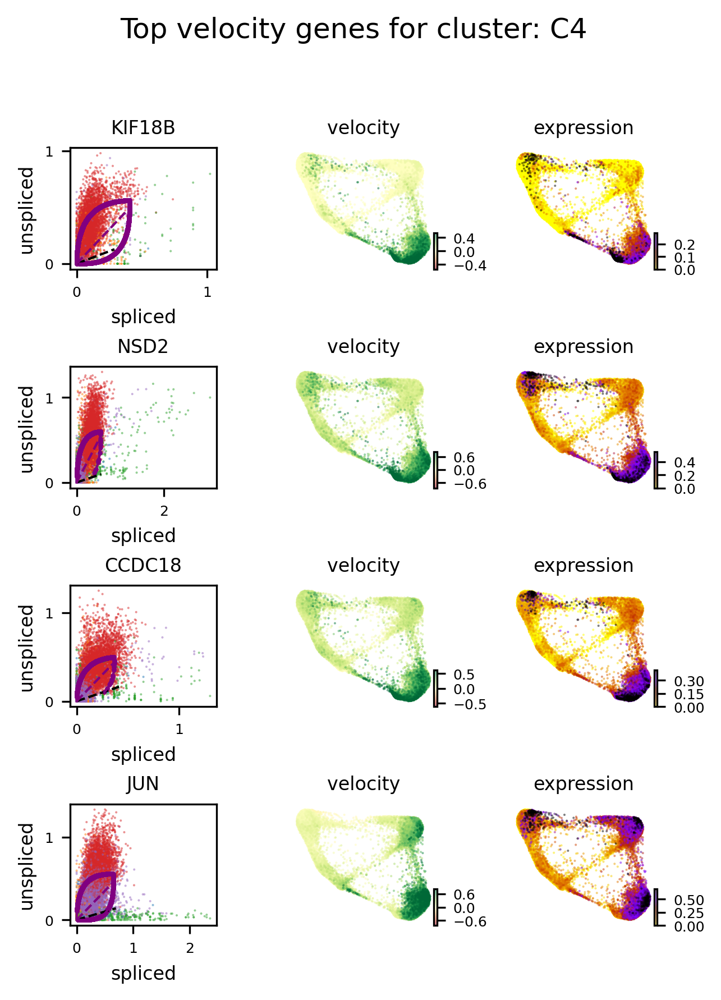

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-

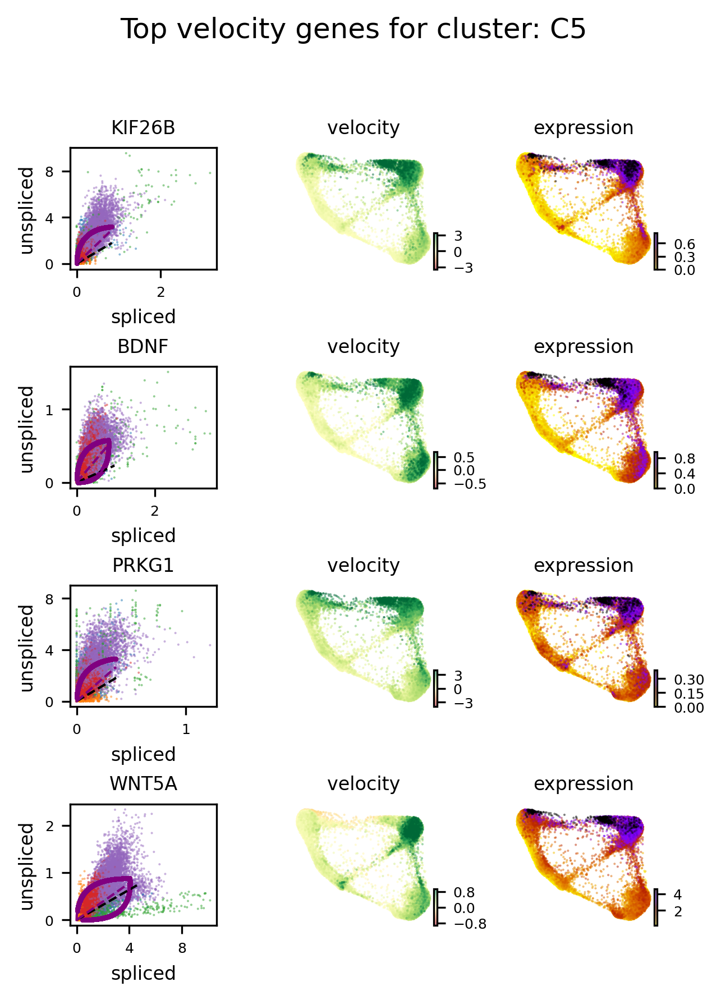

CPU times: user 46.3 s, sys: 35.5 s, total: 1min 21s
Wall time: 1min 20s


In [22]:
%%time
n_genes = 4

columns = ['C2', 'C3', 'C4', 'C5']

for cluster in columns:
    genes = df[cluster].head(n_genes)

    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = 3, 3

    axes = scv.pl.velocity(
        adata,
        genes,
        basis='X_draw_graph_fa',
        color='cluster_str',
        ncols=1,
        dpi=300,
        show=False,
    )

    # Set figure-level title
    fig = plt.gcf()
    fig.suptitle(f"Top velocity genes for cluster: {cluster}", fontsize=12, y=1.01)
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for title
    plt.show()

In [23]:
n = 25
alpha = 0.05
n_show = 15
database = 'ontology'
# database = 'celltypes'
# database = 'Tabula_Sapiens'

for cluster in df.columns:

    top_n = df[cluster].head(n)
    
    edf = gget.enrichr(top_n, database=database)
    edf['genes'] = edf['overlapping_genes'].apply(lambda x: ",".join(x))
    edf['clean_path'] = edf['path_name'].str.replace(r'\s*\(GO:\d+\)', '', regex=True)
    print('\n', "="*30, cluster, "="*30)
    print(edf[['clean_path', 'adj_p_val', 'genes',]].head(n_show).to_string(index=False))

12:19:28 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        
12:19:29 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        



 ============================== C1 ==============================
                                                    clean_path  adj_p_val                    genes
                          extracellular structure organization   0.032151 LAMA2,COL4A1,THBS1,FBLN5
                 external encapsulating structure organization   0.032151 LAMA2,COL4A1,THBS1,FBLN5
                             extracellular matrix organization   0.073582 LAMA2,COL4A1,THBS1,FBLN5
                                      regulation of chemotaxis   0.077683             PDGFRA,THBS1
                                            myofibril assembly   0.077683             PDGFRA,KRT19
                                  regulation of cell migration   0.077683   PDGFRA,NAV3,NEXN,THBS1
positive regulation of blood vessel endothelial cell migration   0.077683              HIF1A,THBS1
                    regulation of smoothened signaling pathway   0.077683              HERC4,ARMC9
         regulation of blood vessel endoth

12:19:29 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        



 ============================== C2 ==============================
                                              clean_path  adj_p_val              genes
    positive regulation of receptor-mediated endocytosis   0.007841  INSR,SERPINE1,CLU
                                  platelet degranulation   0.039464 SPARC,SERPINE1,CLU
positive regulation of nitric oxide biosynthetic process   0.039464           INSR,CLU
   positive regulation of nitric oxide metabolic process   0.039464           INSR,CLU
                                  sarcomere organization   0.039464         KRT19,MYPN
             regulation of receptor-mediated endocytosis   0.048323       SERPINE1,CLU
                    positive regulation of wound healing   0.048323     SERPINE1,ACTG1
         regulation of nitric oxide biosynthetic process   0.048323           INSR,CLU
                                      myofibril assembly   0.048323         KRT19,MYPN
                                    regulated exocytosis   0.04

12:19:29 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        



 ============================== C3 ==============================
                                                      clean_path  adj_p_val          genes
                            atrioventricular valve morphogenesis   0.069267    SLIT3,SMAD6
                                       potassium ion homeostasis   0.069267 KCNMA1,SLC12A8
                                      aortic valve morphogenesis   0.069267    SLIT3,SMAD6
                                        aortic valve development   0.069267    SLIT3,SMAD6
                  positive regulation of potassium ion transport   0.069267    DLG1,KCNMA1
                                regulation of cell-cell adhesion   0.069267     MAGI1,PTK2
                         regulation of epithelial cell migration   0.069267       MCC,PTK2
                      regulation of protein modification process   0.069267       FER,PTK2
             regulation of potassium ion transmembrane transport   0.069267    DLG1,KCNMA1
                       

12:19:29 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        



 ============================== C4 ==============================
                                               clean_path  adj_p_val                   genes
                 CENP-A containing chromatin organization   0.000006 CENPI,CENPK,HJURP,CENPP
                    CENP-A containing nucleosome assembly   0.000006 CENPI,CENPK,HJURP,CENPP
                       chromatin remodeling at centromere   0.000006 CENPI,CENPK,HJURP,CENPP
                              centromere complex assembly   0.000007 CENPI,CENPK,HJURP,CENPP
                                         histone exchange   0.000007 CENPI,CENPK,HJURP,CENPP
          DNA replication-independent nucleosome assembly   0.000007 CENPI,CENPK,HJURP,CENPP
                             sister chromatid segregation   0.000397     KIF18B,CENPK,NCAPG2
microtubule cytoskeleton organization involved in mitosis   0.000629  CENPI,CENPK,CENPP,BUB1
                             mitotic spindle organization   0.001247  CENPI,CENPK,CENPP,BUB1
   

G1: root_id='ACTCAATAGTGCTGTA-1' root_key=9300
G2M: root_id='GTCCATAAGGGGATAT-1' root_key=13940


/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-

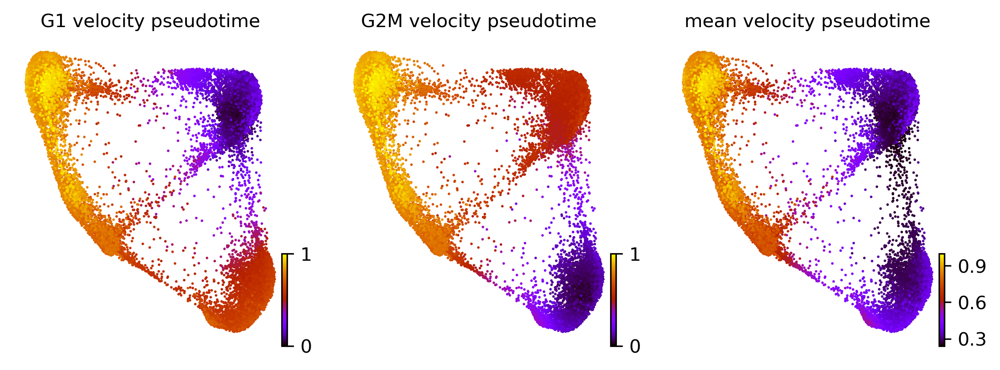

CPU times: user 24.5 s, sys: 26.7 s, total: 51.2 s
Wall time: 43.7 s


In [24]:
%%time
def find_closest_cell(adata, obs_key='barcoded_phase', value='G1', obsm_key='X_pca'):
    """
    Find the cell closest to a median vector in PCA space.

    Parameters:
        adata (AnnData): Annotated data matrix.
        obs_key (str): Key in adata.obs indicating group
        value (str): The value for aggregation 
        obsm_key (str): Key in adata.obsm for PCA or other embedding.

    Returns:
        tuple: (cell_id (str), index (int)) of the closest G1 cell in adata.obs_names
    """
    mask = adata.obs[obs_key] == value
    emb = adata.obsm[obsm_key][mask]

    median_vec = np.median(emb, axis=0)
    dists = cdist(emb, median_vec.reshape(1, -1)).flatten()
    closest_idx = np.argmin(dists)

    cell_id = adata.obs_names[mask][closest_idx]
    cell_index = np.where(adata.obs_names == cell_id)[0][0]

    return cell_id, cell_index

# loop through initial state
for phase, cluster in zip(['G1', 'G2M'], ['C5', 'C4']):
    root_id, root_key = find_closest_cell(
        adata,
        obs_key='cluster_str',
        value=cluster,
    )

    print(f"{phase}: {root_id=} {root_key=}")

    scv.tl.velocity_pseudotime(adata, root_key=root_key)
    adata.obs[f'{phase}_velocity_pseudotime'] = adata.obs['velocity_pseudotime']


adata.obs['mean_velocity_pseudotime'] = adata.obs[['G1_velocity_pseudotime', 'G2M_velocity_pseudotime']].mean(axis=1)


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3

scv.pl.scatter(
    adata, 
    color=['G1_velocity_pseudotime', 'G2M_velocity_pseudotime', 'mean_velocity_pseudotime'],
    basis='X_draw_graph_fa',
    cmap='gnuplot',
)

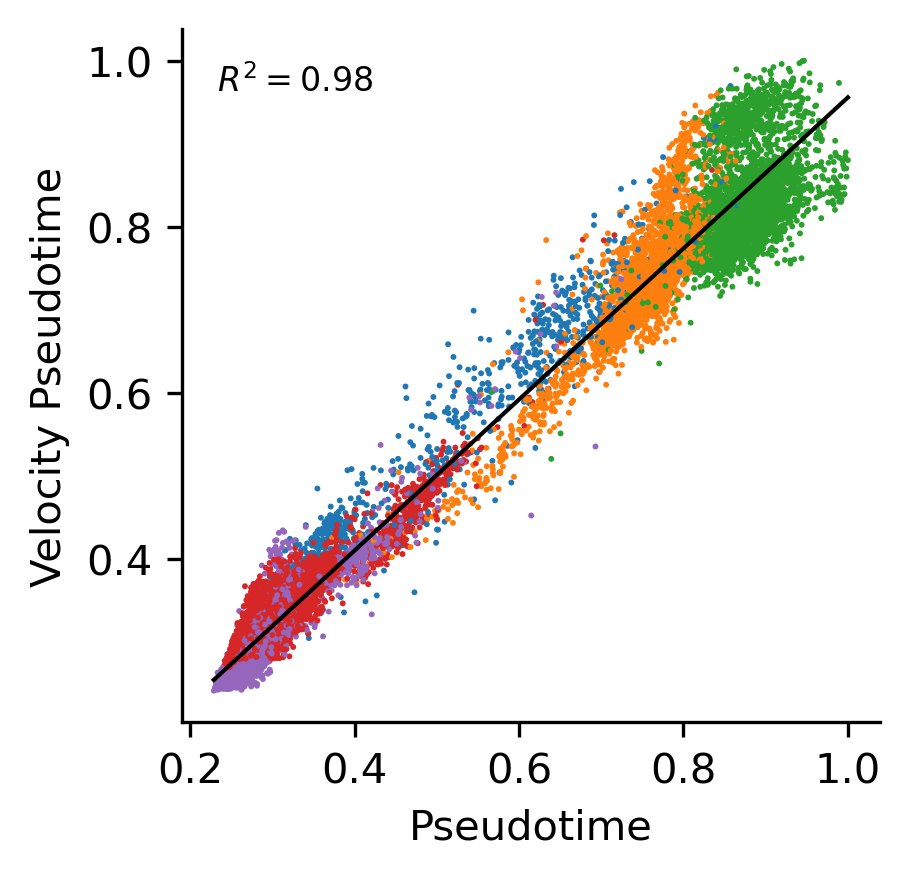

In [25]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3

sns.scatterplot(
    data=adata.obs,
    x='mean_pseudotime',
    y='mean_velocity_pseudotime',
    hue='cluster_str',
    edgecolor='none',
    s=2,
    legend=False,
    linewidth=0
)

# Fit linear model
x = adata.obs['mean_pseudotime']
y = adata.obs['mean_velocity_pseudotime']
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Plot regression line
x_vals = np.linspace(x.min(), x.max(), 100)
plt.plot(x_vals, intercept + slope * x_vals, color='black', linewidth=1)

# Annotate R²
plt.text(0.05, 0.95, f"$R^2 = {r_value**2:.2f}$", transform=plt.gca().transAxes,
         ha='left', va='top', fontsize=8,
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))


# Label axes
plt.xlabel("Pseudotime")
plt.ylabel("Velocity Pseudotime")

# Remove top and right spines for cleaner visualization
sns.despine()

In [26]:
# ?scv.pl.scatter

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-

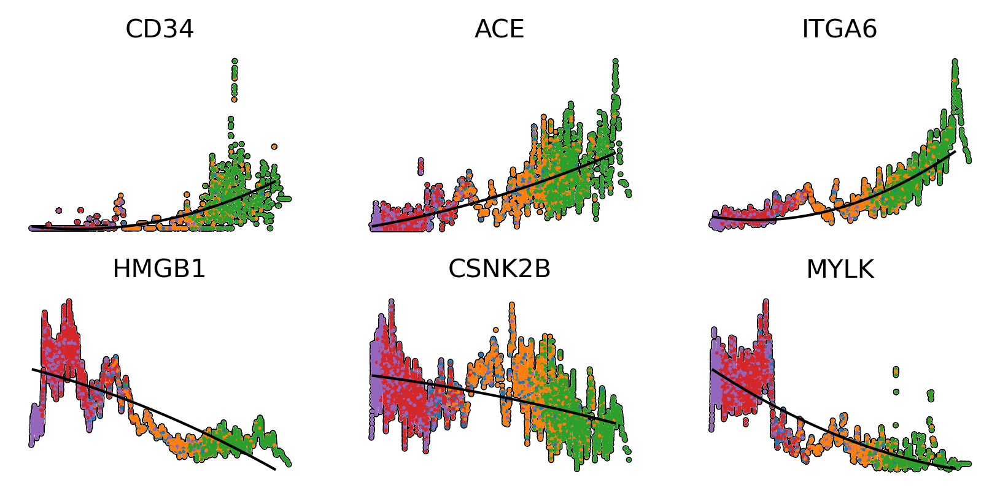

In [27]:
var_names = ['CD34', 'ACE', 'ITGA6', 'HMGB1', 'CSNK2B', 'MYLK']

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.25, 1.5

scv.pl.scatter(
    adata, 
    x='mean_velocity_pseudotime', 
    y=var_names, 
    add_polyfit=True,
    ncols=3,
    normalize_data=True,
    add_outline=True,
    frameon=False,
    n_convolve=50,
    smooth=True,
    color='cluster_str',
)

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


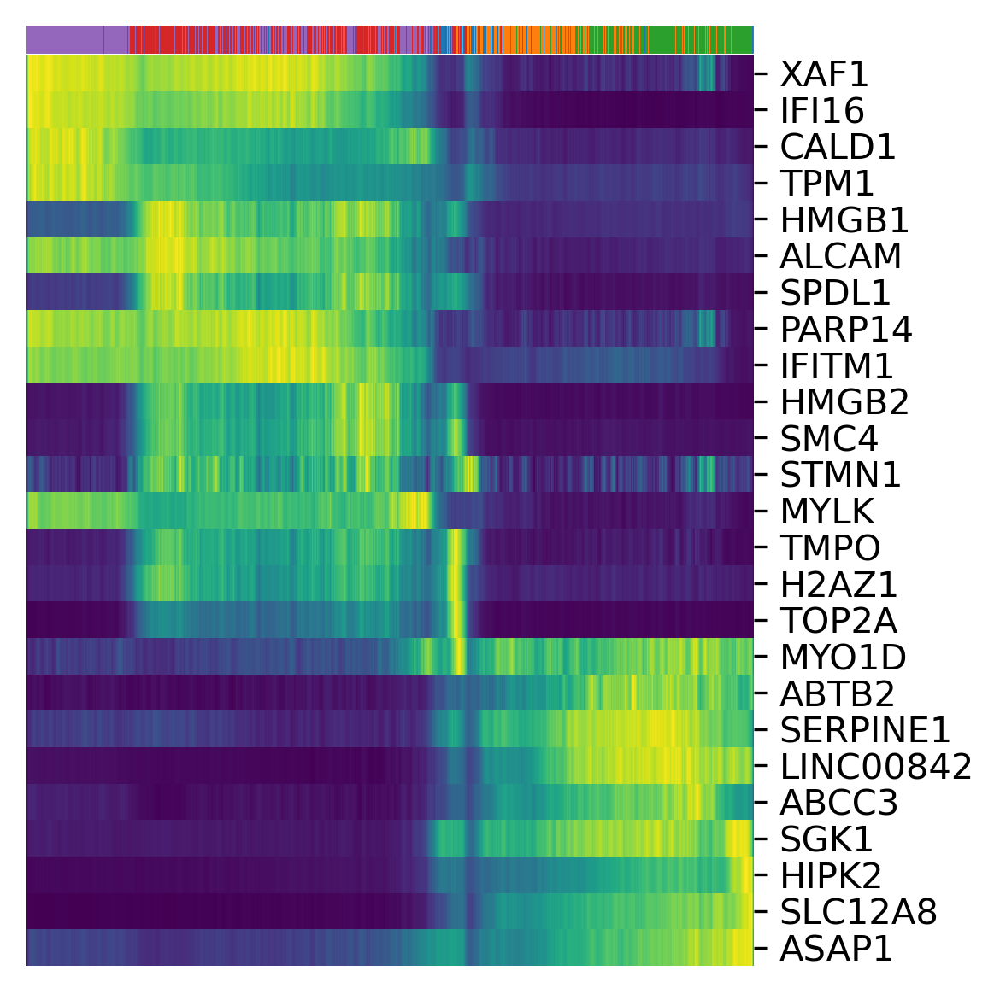

In [28]:
n_genes = 25

df = adata.var.copy()

top_n = df.nlargest(n_genes, 'fit_likelihood')

plt.rcParams['figure.dpi'] = 300

scv.pl.heatmap(
    adata, 
    var_names=top_n.head(n_genes).index, 
    sortby='mean_velocity_pseudotime', 
    col_color='cluster_str', 
    figsize=(4, 4),
    yticklabels=True,
    n_convolve=100,
)

In [29]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

# Latent Time

In [ ]:
%%time
scv.tl.terminal_states(adata)

adata.obs['velocity_root'] = 1 - ((adata.obs['mean_velocity_pseudotime'] - adata.obs['mean_velocity_pseudotime'].min()) / (adata.obs['mean_velocity_pseudotime'].max() - adata.obs['mean_velocity_pseudotime'].min()))
adata.obs['velocity_end'] = 1 - adata.obs['velocity_root']

# power transforms
adata.obs['velocity_root'] = adata.obs['velocity_root'] ** 3
adata.obs['velocity_end'] = adata.obs['velocity_end'] ** 3

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3
scv.pl.scatter(
    adata, 
    basis='X_draw_graph_fa',
    color=["root_cells", "end_points", "velocity_root", "velocity_end"],
)

In [ ]:
%%time
scv.tl.latent_time(
    adata, 
    root_key='velocity_root', 
    end_key='end_points',
)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

scv.pl.scatter(
    adata, 
    basis='X_draw_graph_fa', 
    color='latent_time', 
    color_map='gnuplot',
)

In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3

sns.scatterplot(
    data=adata.obs,
    x='mean_pseudotime',
    y='latent_time',
    hue='cluster_str',
    edgecolor='none',
    s=2,
    legend=False,
    linewidth=0
)

# Fit linear model
x = adata.obs['mean_pseudotime']
y = adata.obs['latent_time']
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Plot regression line
x_vals = np.linspace(x.min(), x.max(), 100)
plt.plot(x_vals, intercept + slope * x_vals, color='black', linewidth=1)

# Annotate R²
plt.text(0.05, 0.95, f"$R^2 = {r_value**2:.2f}$", transform=plt.gca().transAxes,
         ha='left', va='top', fontsize=8,
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))


# Label axes
plt.xlabel("Pseudotime")
plt.ylabel("Velocity Latent Time")

# Remove top and right spines for cleaner visualization
sns.despine()

In [ ]:
genes = ['APBB2', 'ARHGAP11A', 'DUT', 'FSTLL', 'GAS7', 'KIAA1671', 
         'KRT18', 'LINCO0842', 'MAML2', 'MIR193BHG', 'NCOA3', 
         'PALM2AKAP2', 'PTK2', 'SERPINE1', 'SGK1', 'SGO2', 'SLC12A8', 
         'SLIT2', 'SPARC', 'THBS1']


plt.rcParams['figure.dpi'] = 300

scv.pl.heatmap(
    adata, 
    var_names=genes, 
    sortby='latent_time', 
    col_color='cluster_str', 
    figsize=(5, 2.75),
    yticklabels=True,
    n_convolve=100,
)

In [ ]:
break

In [ ]:
# ?scv.pl.scatter

In [ ]:
scv.pl.scatter(
    adata, 
    basis=['AHNAK2' ,'CLU', 'ENO1'],
    color='cluster_str', 
    smooth=True,
    frameon=False,
)

In [ ]:
break

# Recover Dynamics

In [ ]:
%%time
scv.tl.recover_dynamics(adata, n_jobs=8) 

In [ ]:
%%time
def find_closest_cell(adata, obs_key='barcoded_phase', value='G1', obsm_key='X_pca'):
    """
    Find the cell closest to a median vector in PCA space.

    Parameters:
        adata (AnnData): Annotated data matrix.
        obs_key (str): Key in adata.obs indicating group
        value (str): The value for aggregation 
        obsm_key (str): Key in adata.obsm for PCA or other embedding.

    Returns:
        tuple: (cell_id (str), index (int)) of the closest G1 cell in adata.obs_names
    """
    mask = adata.obs[obs_key] == value
    emb = adata.obsm[obsm_key][mask]

    median_vec = np.median(emb, axis=0)
    dists = cdist(emb, median_vec.reshape(1, -1)).flatten()
    closest_idx = np.argmin(dists)

    cell_id = adata.obs_names[mask][closest_idx]
    cell_index = np.where(adata.obs_names == cell_id)[0][0]

    return cell_id, cell_index



root_key, root_idx = find_closest_cell(
    adata,
    obs_key='cluster_str',
    value='C5',
)

print(f"{root_key=} {root_idx=}")

scv.tl.latent_time(adata, root_key=root_idx)

In [ ]:
%%time
root_key, root_idx = find_closest_cell(
    adata,
    obs_key='cluster_str',
    value='C5',
)

print(f"{root_key=} {root_idx=}")

scv.tl.latent_time(adata, root_key=root_idx)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.draw_graph(
    adata, 
    color='latent_time',
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    cmap='gnuplot',
)

In [ ]:
n_genes = 35
count_thr = 500
top_genes = adata.var.sort_values(by='fit_likelihood', ascending=False)
top_genes = top_genes[top_genes['n_cells'] > count_thr]
top_genes.head()

top_genes = top_genes.index[:n_genes]

plt.rcParams['figure.dpi'] = 200

scv.pl.heatmap(
    adata, 
    var_names=top_genes, 
    sortby='velocity_pseudotime', 
    col_color='cluster_str', 
    figsize=(8, 5),
    yticklabels=True,
    n_convolve=30,
    palette='Reds',
)

In [ ]:
break

In [ ]:
# break